In [1]:
import numpy as np
import scipy as sp
import torch as th

import os, pdb, sys, json, glob, tqdm
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

# sns.set_style('whitegrid')

# sns.set_context('notebook')

# %matplotlib notebook
# plt.rcParams['figure.figsize'] = [10, 10]
# plt.rcParams['figure.dpi'] = 200

%load_ext autoreload
%autoreload 2

dev = 'cuda'
root = '/home/ubuntu/ext_vol'
import sys
sys.path.insert(0, f'{root}/inpca')

from utils import get_data, get_idx

In [2]:
import plotly.graph_objects as go
import numpy as np
import plotly.offline as pyo
import pandas as pd
pyo.init_notebook_mode()

In [3]:
%matplotlib inline
import numpy as np

from mpl_toolkits.mplot3d import proj3d
from matplotlib.patches import FancyArrowPatch
from matplotlib import rc
import scipy.linalg as splin
from sklearn.manifold import TSNE
import matplotlib.gridspec as gridspec


def plot3D(px,py,pz,clist,emphPoints = [],cmap='plasma',title='',
           shadow=False,useCMAP = True,xLabel='',yLabel='',zLabel='',savefig='',saveN = 1, setRange = 0):
    
    elev = 30
    azim = 60

    viewVect = [np.cos(np.pi*180/elev)*np.sin(np.pi*180/azim),np.cos(np.pi*180/elev)*np.cos(np.pi*180/azim),np.cos(np.pi*180/elev)]
    
    thetalist = np.linspace(0,2*np.pi,saveN + 1)
    thetalist = thetalist[:-1]
    
    projMat = np.array([px,py])
    
    for idx in range(saveN):
        theta = thetalist[idx]
        rotMat = np.array([[np.cos(theta),-np.sin(theta)],[np.sin(theta),np.cos(theta)]])
        
        rotx,roty = np.dot(rotMat,projMat)
        rotz = pz
        clistRot = clist
        
        p = np.array([rotx,roty,rotz])
        dots = np.array(np.dot(viewVect,p))
        sort = dots.argsort()
        
        fig = plt.figure(figsize=(10, 10))
        ax = fig.add_subplot(projection='3d')
#         fig, ax = plt.subplots(figsize = (10,10))
        
        ax.set_alpha(0)
#         ax.axis('off')
        
#         ax = fig.gca(projection='3d')
        
        ax.patch.set_alpha(0)

        Xdist = px.max() - px.min()
        Xcntr = (px.max() + px.min())/2.0
        Ydist = py.max() - py.min()
        Ycntr = (py.max() + py.min())/2.0
        Zdist = pz.max() - pz.min()
        Zcntr = (pz.max() + pz.min())/2.0

        if setRange == 0:
            dist = 0.55*max(Xdist,Ydist,Zdist)
        else:
            dist = 0.55*setRange

        for p in emphPoints:
            ax.scatter([rotx[p]],[roty[p]],[rotz[p]],c='C1',s=200)
            if shadow:
                ax.scatter([rotx[p]],[roty[p]],[Zcntr - dist],c='black',alpha=0.5)
                ax.scatter([rotx[p]],[Ycntr + dist],[rotz[p]],c='black',alpha=0.5)
                ax.scatter([Xcntr - dist],[roty[p]],[rotz[p]],c='black',alpha=0.5)
        
        rotx = rotx[sort]
        roty = roty[sort]
        rotz = rotz[sort]
        clistRot = np.array(clistRot)[sort]
        
        if useCMAP:
            ax.scatter(rotx,roty,rotz,c=clistRot,edgecolor='black',linewidth=0.2,cmap = cmap)
        else:
            ax.scatter(rotx,roty,rotz,c=clistRot,edgecolor='black',linewidth=0.2)


        ax.set_xlim([Xcntr - dist, Xcntr + dist])
        ax.set_ylim([Ycntr - dist, Ycntr + dist])
        ax.set_zlim([Zcntr - dist, Zcntr + dist])

        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])

        #ax.set_axis_off()
        #plt.show()

        if shadow:
            #fig = plt.figure(figsize = (10,10))
            #ax = fig.gca(projection='3d')
            #ax.view_init(30,-60)

            ax.scatter(rotx,roty,[Zcntr - dist for p in rotz],c='black',alpha=0.01)
            ax.scatter(rotx,[Ycntr + dist for p in roty],rotz,c='black',alpha=0.01)
            ax.scatter([Xcntr - dist for p in rotx],roty,rotz,c='black',alpha=0.01)

            ax.set_xlim([Xcntr - dist, Xcntr + dist])
            ax.set_ylim([Ycntr - dist, Ycntr + dist])
            ax.set_zlim([Zcntr - dist, Zcntr + dist])

            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_zticks([])

            #ax.set_axis_off()
        ax.set_xlabel(xLabel,fontsize=16)
        ax.set_ylabel(yLabel,fontsize=16)
        ax.set_zlabel(zLabel,fontsize=16)
        
        if title == '':
            pass
        else:
            plt.title(title,fontsize=30)

        if savefig == '':
            plt.show()
        else:
            plt.savefig(savefig+str(idx)+'.png')
            plt.close()
    
def trianglePlot(arry,clist,emphPoints = [],dim=2,hideAxes = False, setRange=0):
    
    if setRange == 0:
        ranges = [arry[:,idx].max()-arry[:,idx].min() for idx in range(dim+1)]
    else:
        ranges = [setRange]
    axesDist = 0.6*max(ranges)
    
    figs,axs = plt.subplots(nrows=dim,ncols=dim,figsize=(10,10))
    for row in range(dim-1,-1,-1):
        for col in range(dim-1,-1,-1):
            if col >= row:
                py = arry[:,row]
                px = arry[:,col+1]
                
                centerX = (px.max()+px.min())/2
                centerY = (py.max()+py.min())/2
                
                sc1 = axs[row,col].scatter(px,py,s=5,c=clist,edgecolor='black',linewidth=0.2, cmap='plasma')
                for p in emphPoints:
                    axs[row,col].scatter([px[0]],[py[0]],s=100,c='C1',edgecolor='black',linewidth=0.2)
                
                axs[row,col].set_xlim([centerX-axesDist,centerX+axesDist])
                axs[row,col].set_ylim([centerY-axesDist,centerY+axesDist])
                if (row != col) or (hideAxes == True):
                    axs[row,col].set_xticks([])
                    axs[row,col].set_yticks([])
                if row == col:
                    axs[row,col].set_ylabel('dir.'+str(row+1),fontsize=16)
                    axs[row,col].set_xlabel('dir.'+str(col+2),fontsize=16)
                axs[row,col].ticklabel_format(style='sci',scilimits=(-2,2),axis='both')
            else:
                axs[row,col].axis('off')
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

In [5]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yh_all.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_yh_all.p").reset_index(drop=True)

In [161]:
df = {}
for (c, ii) in didx.groupby(['m', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    di = didx.iloc[ii]
    df[c] = np.zeros([len(di.t.unique()), r['xp'].shape[1]])
    for (i, t) in enumerate(di.t.unique()):
        ti = get_idx(di, f"t=={t}")
        df[c][i, :] = np.mean(r['xp'][ti, :], axis=0)

In [156]:
get_idx(m1, "t==0")

[1903, 20767, 32485, 47657, 62370, 77542, 94091, 108685, 124559, 138143]

[Text(0.5, 1.0, '1 - err')]

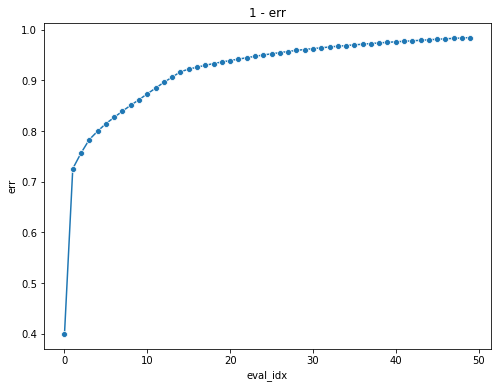

In [53]:
fn = r['fn']
df = pd.DataFrame(dict(eval_idx=np.arange(len(es)), err=1 - np.sqrt(1-np.cumsum(es ** 2)/fn**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='err', marker="o")
g.set(title="1 - err")

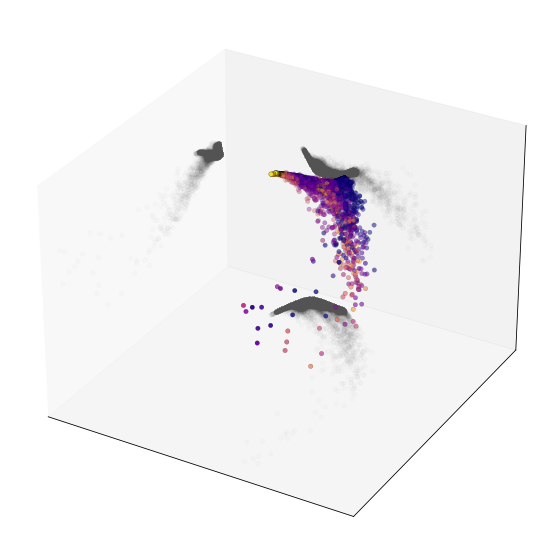

In [21]:
plot3D(r['xp'][:, 0], r['xp'][:, 1], r['xp'][:, 2],
       clist=didx.t, emphPoints = [],cmap='plasma',title='',
           shadow=True,useCMAP = True,xLabel='',yLabel='',zLabel='',savefig='',saveN = 1, setRange = 0)

In [42]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yh_all_geod.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all.p").reset_index(drop=True)
idxs = []
for (config, ii) in didx.groupby(['m', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    tmax = didx.iloc[ii]['t'].max()
    didx.loc[ii, 't'] /= tmax
    if didx.iloc[ii[-1]]['err'] < 0.1 :
        idxs.extend(ii)
didx = didx.iloc[idxs].reset_index(drop=True)
r['xp'] = r['xp'][idxs, :]

In [43]:
emph = list(didx[didx.m=='geodesic'].index)

[ 19270.908  -12883.779    3048.0312  -2672.1438   1997.1318   1830.1987
   1595.4198]


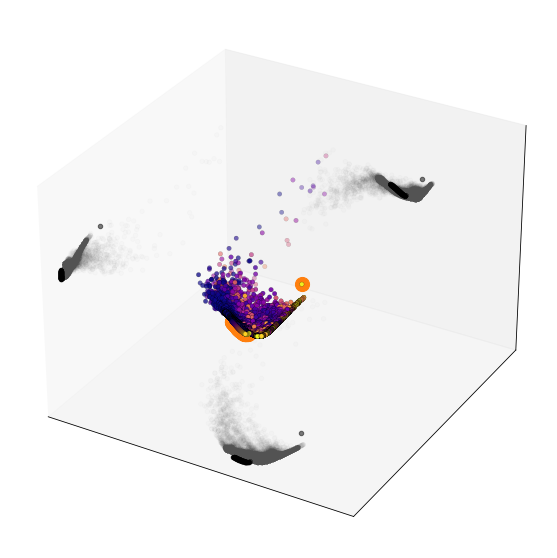

In [45]:
print(r['e'])
plot3D(r['xp'][:, 0], r['xp'][:, 1], r['xp'][:, 2],
       clist=didx.t, emphPoints = emph,cmap='plasma',title='',
           shadow=True,useCMAP = True,xLabel='',yLabel='',zLabel='',savefig='',saveN = 1, setRange = 0)

In [ ]:
w = r['w']
import scipy.sparse.linalg as sp
ne = 50
es = sp.eigsh(w, ne, which='LM', return_eigenvectors=False)[::-1]
fn=np.linalg.norm(w, ord='fro')


## Plotly

In [166]:
def plot3d(dc, r, dims=[0, 1, 2], key='widen', markers=["o", "x", "s", "*", "+"],
           cmap='vlag', cdict=None, ckey='', sdict={}):
    fig = plt.figure(1, figsize=(10, 10))
    ax = fig.add_subplot(projection='3d')

    ee = r['e']
    print(ee)
    c = dc[ckey]
    if cdict:
        c = c.fillna('nan')
        c = c.map(cdict)
        print(cdict)
    d1, d2, d3 = dims
    for (i, (k, ii)) in enumerate(dc.groupby(key).indices.items()):
        xx = r['xp'][ii]
        s = sdict.get(k, 3)
        sc = ax.scatter(xx[:, d1], xx[:, d2], xx[:, d3],
                        c=c[ii], cmap=cmap, vmin=c.min(), vmax=c.max(),
                        label=k,  marker=markers[i], s=s, lw=0.5, alpha=0.5,
                        picker=True, pickradius=1)

        #                 sc = ax.plot(xx[:, d1], xx[:, d2], label=k, lw=0.5)
        ax.set_xlabel(f'pc{d1}, {ee[d1]:.2f}')
        ax.set_ylabel(f'pc{d2}, {ee[d2]:.2f}')
        ax.set_zlabel(f'pc{d3}, {ee[d3]:.2f}')
        
        ax.set_xlim([-1, 1])
        ax.set_ylim([-1, 1])
        ax.set_zlim([-1, 1])

    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, labels, loc = 'lower center')
    clb = plt.colorbar(sc, pad=0.2, ax=ax)
    clb.ax.set_title(ckey)
    
    plt.show()


In [167]:
def plotly_3d(dc, r, return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'bn', 'lr', 'wd', 'corner'],
              color='t', cmap=None, mode='markers', separate_traj=False, axis_range=[-1, 1]):

    for (config, idxs) in dc.groupby(['m', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
        tmax = dc.iloc[idxs]['t'].max()
        dc.loc[idxs, 't'] /= tmax
    for i in range(ne):
        dc[f"x{i+1}"] = r['xp'][:, i]
    d_ = dc
    c = dc[color]
    if cmap is not None:
        c = c.map(cmap)
        
    for col in cols:
        dc[col] = f'{col}: ' + dc[col].astype(str)
    text = dc[cols].apply("<br>".join, axis=1)
    text = 't: ' + dc['t'].astype(str) + '<br>' + text

    if separate_traj:
        fig = go.Figure()
        for (i, (conds, ii)) in enumerate(list(d_.groupby(groups).indices.items())):
            dc_ = dc.iloc[ii].reset_index()
            fig.add_trace(
                go.Scatter3d(
                x=dc_[f'x{dims[0]}'],  
                y=dc_[f'x{dims[1]}'],  
                z=dc_[f'x{dims[2]}'],  
                hovertemplate='<b>%{text}</b><extra></extra>',
                text=text[ii],
                marker=dict(
                    size=2,
                    opacity=0.8,
                    color=c[ii],
                    symbolsrc='m',
                    colorscale='Viridis',
                ),
                mode=mode,
                line=dict(
                    color=c[ii],
                    width=2,
                ),
                name=conds[-1]
            ),
                
            )
    else:
        fig = go.Figure(data=[
            go.Scatter3d(
                x=dc[f'x{dims[0]}'],  
                y=dc[f'x{dims[1]}'],  
                z=dc[f'x{dims[2]}'],  
                hovertemplate='<b>%{text}</b><extra></extra>',
                text=text,
                marker=dict(
                    size=2,
                    opacity=0.8,
                    color=c,
                    symbolsrc='m',
                    colorscale='Viridis',
                ),
                mode='markers',
            )
        ])
    fig.update_layout(
        autosize=False,
        width=1000,
        height=1000,
        scene_xaxis_range=axis_range,
    scene_yaxis_range=axis_range,
    scene_zaxis_range=axis_range,
    scene_aspectmode='cube')

    print(r['e'])

    results = [fig]
    if return_text: 
        results.append(text)
    if return_d:
        results.append(d_)
    return results

def plotly_2d(dc, text, ne=3):
    fig = go.Figure(data=go.Splom(
                dimensions=[dict(label=f'x{i}',
                                 values=dc[f'x{i}']) for i in range(1, ne+1)],
                showupperhalf=False, # remove plots on diagonal
                diagonal_visible=False,
                text=text,
                marker=dict(color=dc.t,
                            showscale=False, # colors encode categorical variables
                            line_color='white', size=2, opacity=0.8)
                ), )


    fig.update_layout(
        autosize=False,
        width=1000,
        height=1000
    )

    fig.show()

In [168]:
def triplot(dc, r, d=3, key='widen', cmap='vlag', cdict=None, ckey='', sdict={},
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, avggroupby=['opt'], plot_lines=False,
            xrange=[-1, 1], yrange=[-1, 1]
            ):
    figs, axs = plt.subplots(d-1, d-1, figsize=(12, 12),
                            sharex=True, sharey=True)
    ee = r['e']
    c = dc[ckey]
    if cdict:
        c = c.fillna('nan')
        c = c.map(cdict)
        print(cdict)
    for (i1, d1) in enumerate(range(d-1)):
        for (i2, d2) in enumerate(range(d1+1, d)):
            if d2 > d1 + 1:
                axs[d1, d2-1].set_visible(False)
            ax = axs[d2-1, d1]
            ax.axis("square")
            for (i, (k, ii)) in enumerate(dc.groupby(key).indices.items()):
                s = sdict.get(k, 1)
                xx = r['xp'][ii]
                sc = ax.scatter(xx[:, d1], xx[:, d2],
                                c=c[ii], cmap=cmap, vmin=c.min(), vmax=c.max(),
                                label=k,  marker=markers[i], s=s, lw=0.5, alpha=0.5)
                ax.set_xlim(xrange)
                ax.set_ylim(yrange)
                if plot_lines:
                    config_cols = ['seed', 'm', 'opt', 'bs', 'aug', 'bn', 'lr', 'wd']
                    config_cols.remove(key)
                    dc_ = dc.iloc[ii]
                    for (c, ii_) in dc_.groupby(config_cols).indices.items():
                        xx_ = xx[ii_]
                        print(dc_.iloc[ii_]['t'])
                        _ = sns.lineplot(x=xx_[:, d1], y=xx_[:, d2], ax=ax, legend=False, lw=0.2)

                    #                 sc = ax.plot(xx[:, d1], xx[:, d2], label=k, lw=0.5)
                if ee[d1] < 0:
                    ax.spines['bottom'].set_color('red')
                if ee[d2] < 0:
                    ax.spines['left'].set_color('red')
                ax.set_xlabel(f'pc{d1+1}')
                ax.set_ylabel(f'pc{d2+1}')
            if plot_avg:
                iavg = get_idx(dc, f't >= 0 & seed == -1')
                for (k, v) in dc.iloc[iavg].groupby(avggroupby).indices.items():
                    avg_ms = r['xp'][v]
                    avg = sns.lineplot(x=avg_ms[:, d1], y=avg_ms[:, d2],
                                       label=k, ax=ax, legend=False, lw=1.0)
    handles, labels = ax.get_legend_handles_labels()
    if evals:
        ax = figs.add_subplot(d-1, d-1, 2)
        ax.set_yscale('log')
        ax.grid()
        w = 0.5
        for e in ee:
            ax.plot((-w/4, w/4), (np.abs(e), np.abs(e)),
                    c='k' if e > 0 else 'r')
        ax.set_xlim([-w/2, w/2])
        ax.get_xaxis().set_visible(False)

    ax = axs[0, -1]
    clb = plt.colorbar(sc, pad=0.2, ax=ax)
    clb.ax.set_title(ckey)
    ax = axs[0, -1]
    ax.legend(handles, labels, loc='lower center')
    plt.show()

In [ ]:
fn = 'yh_all'
loc = f'{root}/inpca/inpca_results_all/simple_aug'
_, dc = th.load(os.path.join(loc,'didx_%s.p'%fn))
r = th.load(os.path.join(loc,'r_%s.p'%fn))
plotly_3d(dc=dc.reset_index(drop=True), r=r, ne=3, return_text=False,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='t', cmap=None, mode='markers')

#### Corners

In [ ]:
colors = ["darkred", "blue", "turquoise", "green", "gold", "purple"]

fn = 'yh_all'
loc = f'{root}/inpca/inpca_results_all/corners'
dc = th.load(os.path.join(loc,'didx_%s.p'%fn))['dc']
r = th.load(os.path.join(loc,'r_%s.p'%fn))
fig, text, dc = plotly_3d(dc=dc.reset_index(drop=True), r=r, ne=3, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd', 'corner'],
              color='t', mode='lines', separate_traj=True, axis_range=[-2, 2],
              )
fig.update_layout(title="corners")
fig.show()

{'corner: normal': 0, 'corner: uniform': 1, 'corner: subsample-200': 2, 'corner: subsample-2000': 3}


/tmp/ipykernel_4910/3222325150.py:63: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



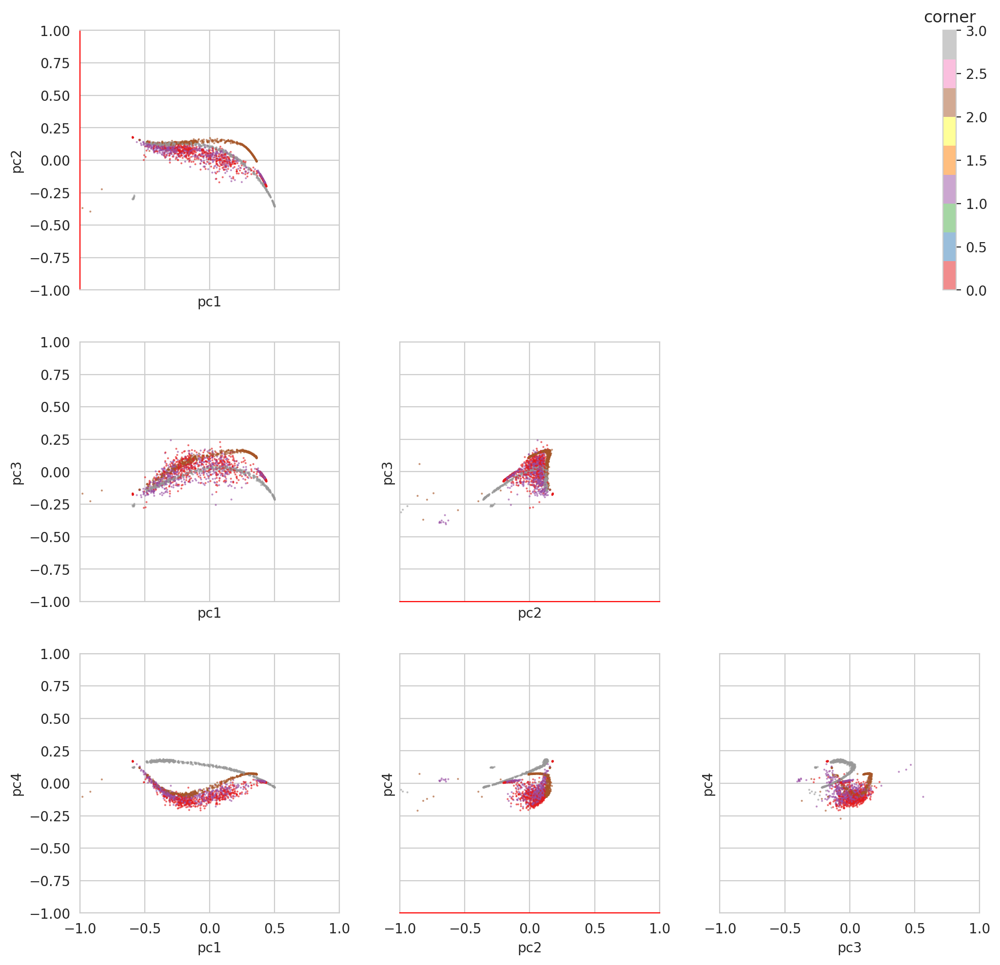

In [131]:
cmap = {f"corner: {c}": i for (i, c) in enumerate(['normal', 'uniform', 'subsample-200', 'subsample-2000'])} 
triplot(dc, r, d=4, key='aug', ckey='corner', cmap='Set1', cdict=cmap, sdict={},
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False
            )

[Text(0.5, 1.0, '1 - err')]

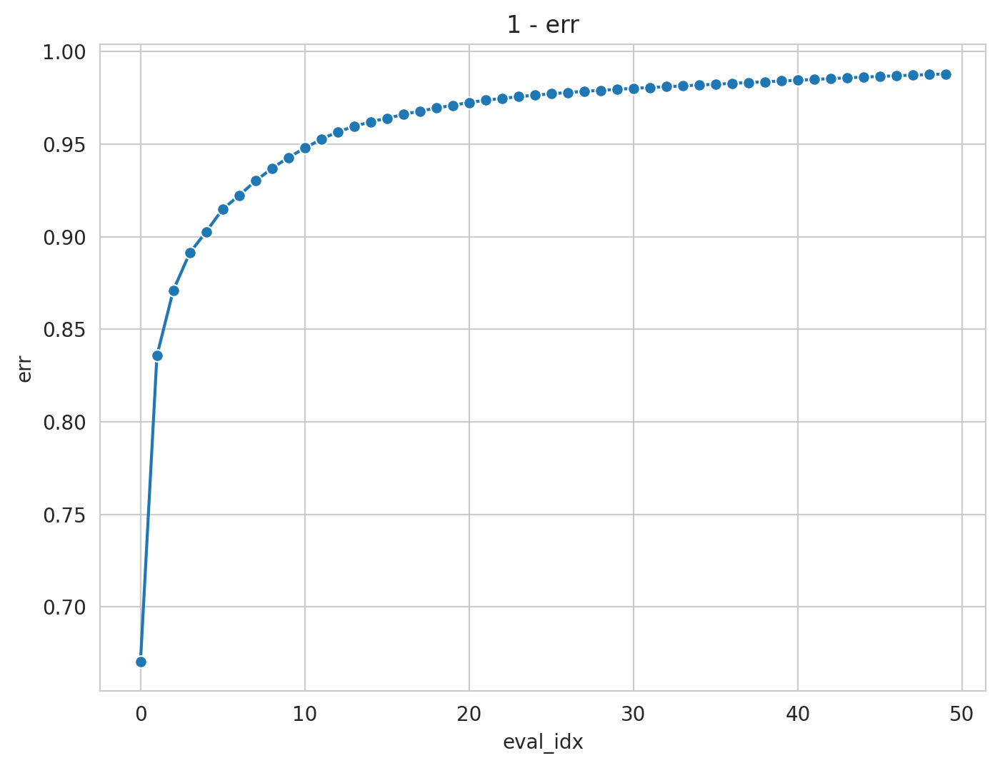

In [132]:
w = r['w']
import scipy.sparse.linalg as sp
ne = 50
es = sp.eigsh(w, ne, which='LM', return_eigenvectors=False)[::-1]
fn=np.linalg.norm(w, ord='fro')
df = pd.DataFrame(dict(eval_idx=np.arange(len(es)), err=1 - np.sqrt(1-np.cumsum(es ** 2)/fn**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='err', marker="o")
g.set(title="1 - err")

### all evals

#### Train Data

In [207]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yh_all.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_yh_all.p").reset_index(drop=True)

In [205]:
idxs = []
for (config, ii) in didx.groupby(['m', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    tmax = didx.iloc[ii]['t'].max()
    didx.loc[ii, 't'] /= tmax
    if didx.iloc[ii[-1]]['err'] < 0.1:
        idxs.extend(ii)
didx = didx.iloc[idxs].reset_index(drop=True)
r['xp'] = r['xp'][idxs, :]

In [206]:
len(didx)

142345

<IPython.core.display.Javascript object>


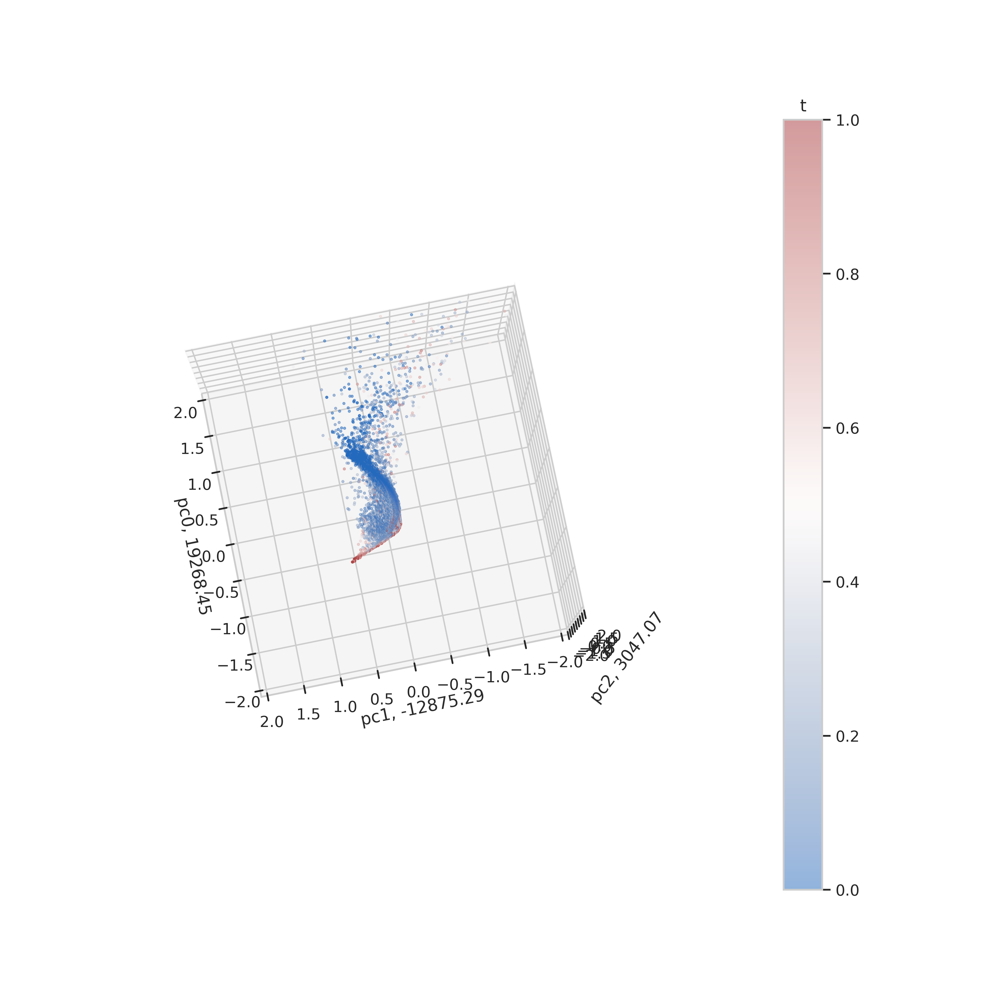

[ 19268.445  -12875.293    3047.0696  -2664.8076   1997.0637   1829.7493
   1594.2693]


In [87]:
%matplotlib notebook
fig = plt.figure(1, figsize=(10, 10))
ax = fig.add_subplot(projection='3d')

ee = r['e']
print(ee)
c = didx['t']

xx = r['xp']
sc = ax.scatter(xx[:,0], xx[:, 2], xx[:, 2],
                c=c, cmap='vlag', vmin=c.min(), vmax=c.max(),
                lw=0.5, alpha=0.5, s=3)

ax.set_xlabel(f'pc0, {ee[0]:.2f}')
ax.set_ylabel(f'pc1, {ee[1]:.2f}')
ax.set_zlabel(f'pc2, {ee[2]:.2f}')

ax.set_xlim([-2, 2])
ax.set_ylim([-2, 2])
ax.set_zlim([-2, 2])

handles, labels = ax.get_legend_handles_labels()
clb = plt.colorbar(sc, pad=0.2, ax=ax)
clb.ax.set_title('t')

plt.show()


In [ ]:
fig, text, dc = plotly_3d(dc=didx.reset_index(drop=True), r=r, ne=5, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='t',mode='markers', cmap=None, separate_traj=False, axis_range=[-1.5, 1.5])
fig.show()

<IPython.core.display.Javascript object>


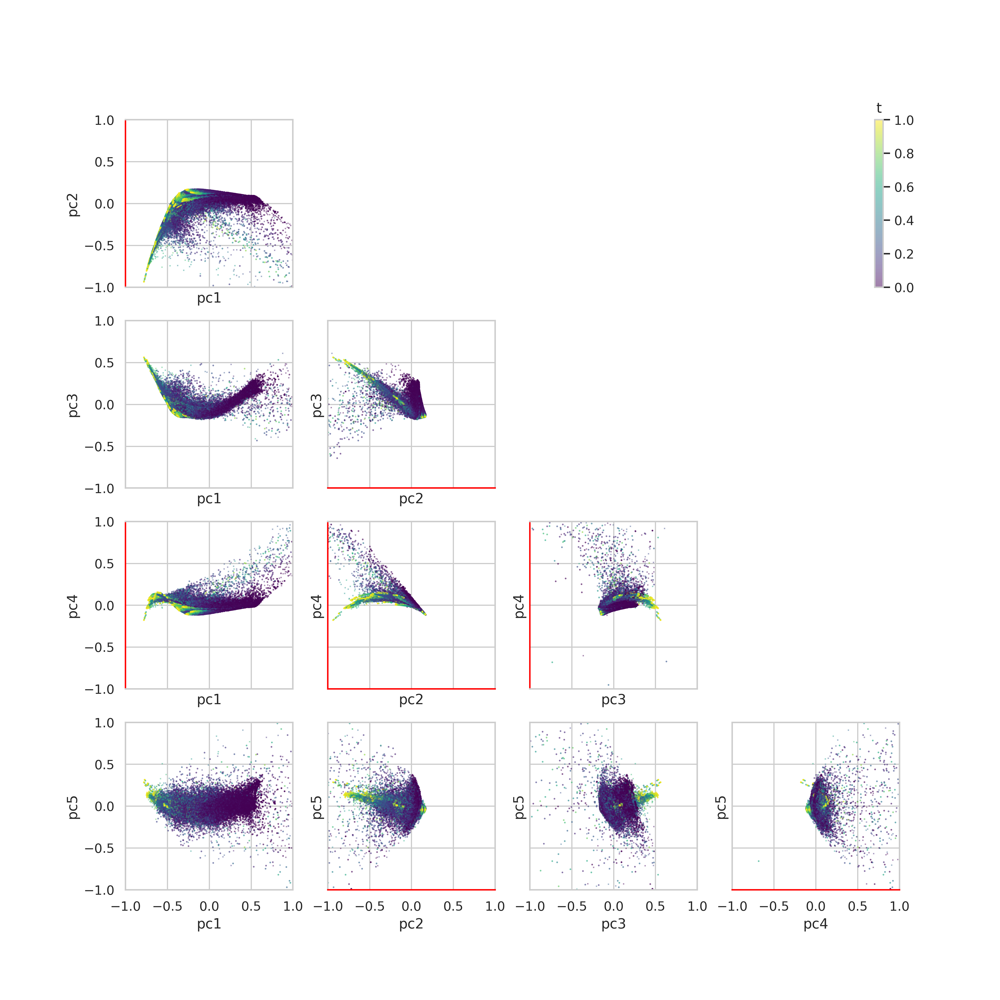

In [89]:
triplot(dc, r, d=5, key='aug', cmap='viridis', cdict=None, ckey='t', sdict={},
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False
            )

In [104]:
es = r['es'][-50::]
es = es[::-1]

#### Train with Geod (included in embedding)

In [4]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yh_all_geod.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_geod_all.p").reset_index(drop=True)

In [ ]:
idxs = []
for (config, ii) in didx.groupby(['m', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    tmax = didx.iloc[ii]['t'].max()
    didx.loc[ii, 't'] /= tmax
    if didx.iloc[ii[-1]]['err'] < 0.1 and ((didx.iloc[ii]['m'] == 'allcnn').all() or (didx.iloc[ii]['m'] == 'geodesic').all() ):
        idxs.extend(ii)
didx = didx.iloc[idxs]
r['xp'] = r['xp'][idxs, :]

In [22]:
import h5py
f = h5py.File('/home/ubuntu/ext_vol/inpca/inpca_results_all/w_yh_all_geod.h5', 'r')
w = f["w"]

In [21]:
f.close()

In [23]:
didx[didx['t']==0]

,seed,m,opt,t,err,favg,verr,vfavg,bs,aug,bn,lr,wd
0,42,allcnn,sgd,0.0,0.90000,2.302771,0.9000,2.302763,500,none,True,0.25,0.0
62,42,allcnn,sgd,0.0,0.90000,2.302771,0.9000,2.302763,200,none,True,0.1,0.0
129,42,allcnn,sgdn,0.0,0.90000,2.302771,0.9000,2.302763,200,none,True,0.1,0.0
196,42,allcnn,sgd,0.0,0.90000,2.302771,0.9000,2.302763,200,none,True,0.1,0.001
263,42,allcnn,sgd,0.0,0.90000,2.302836,0.9000,2.302763,500,simple,True,0.25,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
151159,51,wr-16-4-64,sgd,0.0,0.90752,2.304746,0.9047,2.304772,500,none,True,0.25,0.001
151221,51,wr-16-4-64,sgd,0.0,0.89282,2.304740,0.9047,2.304772,500,simple,True,0.25,0.001
151283,51,wr-16-4-64,sgdn,0.0,0.90752,2.304746,0.9047,2.304772,500,none,True,0.25,0.001
151345,51,wr-16-4-64,sgdn,0.0,0.89282,2.304740,0.9047,2.304772,500,simple,True,0.25,0.001


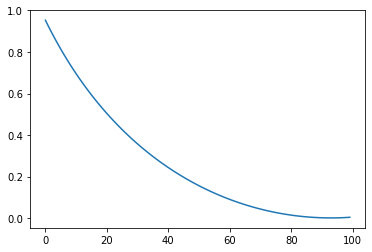

In [27]:
plt.plot(w[196, -100:])

In [30]:
didx[didx['t']==0]

,seed,m,opt,t,err,favg,verr,vfavg,bs,aug,bn,lr,wd
0,42,allcnn,sgd,0.0,0.90000,2.302771,0.9000,2.302763,500,none,True,0.25,0.0
62,42,allcnn,sgd,0.0,0.90000,2.302771,0.9000,2.302763,200,none,True,0.1,0.0
129,42,allcnn,sgdn,0.0,0.90000,2.302771,0.9000,2.302763,200,none,True,0.1,0.0
196,42,allcnn,sgd,0.0,0.90000,2.302771,0.9000,2.302763,200,none,True,0.1,0.001
263,42,allcnn,sgd,0.0,0.90000,2.302836,0.9000,2.302763,500,simple,True,0.25,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
151159,51,wr-16-4-64,sgd,0.0,0.90752,2.304746,0.9047,2.304772,500,none,True,0.25,0.001
151221,51,wr-16-4-64,sgd,0.0,0.89282,2.304740,0.9047,2.304772,500,simple,True,0.25,0.001
151283,51,wr-16-4-64,sgdn,0.0,0.90752,2.304746,0.9047,2.304772,500,none,True,0.25,0.001
151345,51,wr-16-4-64,sgdn,0.0,0.89282,2.304740,0.9047,2.304772,500,simple,True,0.25,0.001


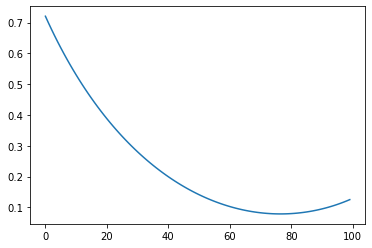

In [36]:
plt.plot(w[-100:, 62])

In [ ]:
fig, text, dc = plotly_3d(dc=didx.reset_index(drop=True), r=r, ne=5, return_text=True, return_d=True,
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='t',mode='markers', cmap=None, separate_traj=False, axis_range=[-1.5, 1.5])
fig.show()

<IPython.core.display.Javascript object>


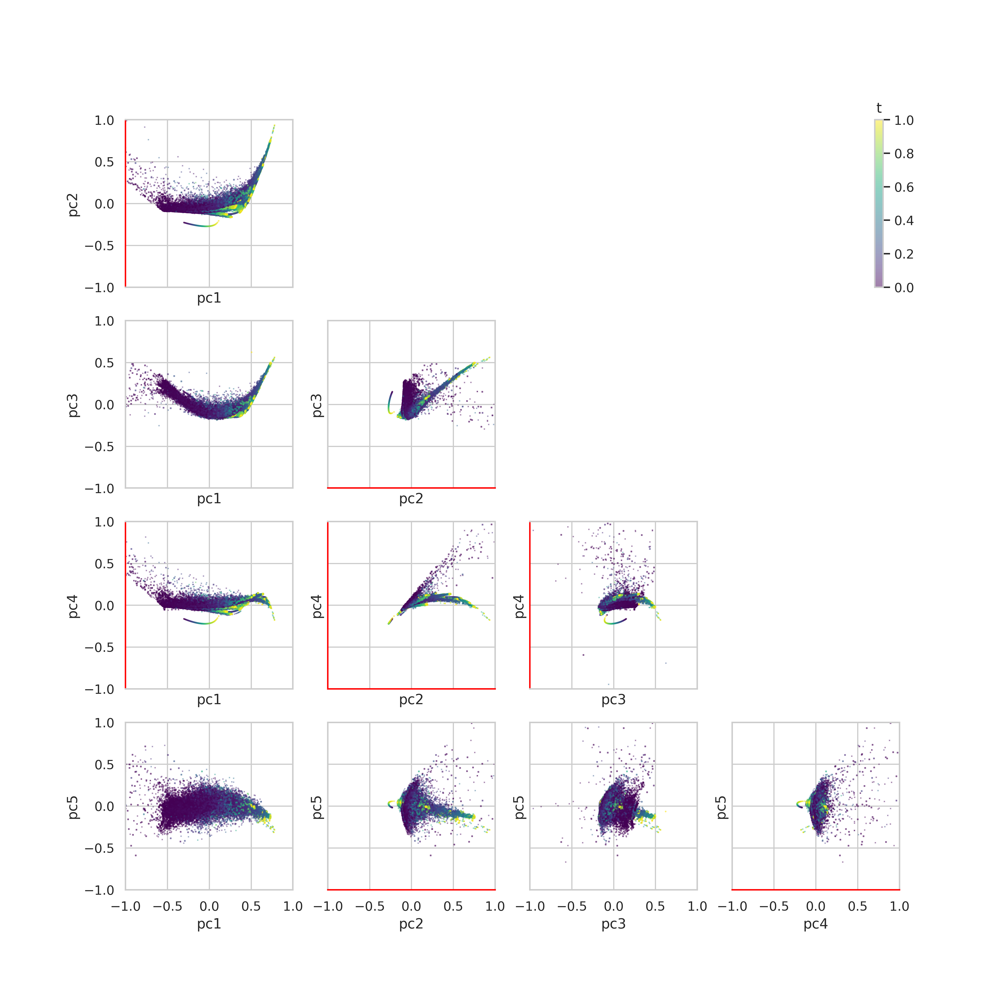

In [94]:
triplot(dc, r, d=5, key='aug', cmap='viridis', cdict=None, ckey='t', sdict={},
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False
            )

#### Val Data

In [95]:
r = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/r_yvh_all.p")
didx = th.load("/home/ubuntu/ext_vol/inpca/inpca_results_all/didx_yvh_all.p").reset_index(drop=False)
idxs = []
for (config, ii) in didx.groupby(['m', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
    tmax = didx.iloc[ii]['t'].max()
    didx.loc[ii, 't'] /= tmax
    if didx.iloc[ii[-1]]['err'] < 0.1 and (didx.iloc[ii]['opt'] != 'adam').all():
        idxs.extend(ii)
didx = didx.iloc[idxs]
r['xp'] = r['xp'][idxs, :]

In [ ]:
f, dc= plotly_3d(dc=didx.reset_index(drop=True), r=r, ne=5, return_d=True, dims=[1, 2, 4],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              color='t',mode='markers',separate_traj=False, axis_range=[-1.5, 1.5])
f.show()

<IPython.core.display.Javascript object>


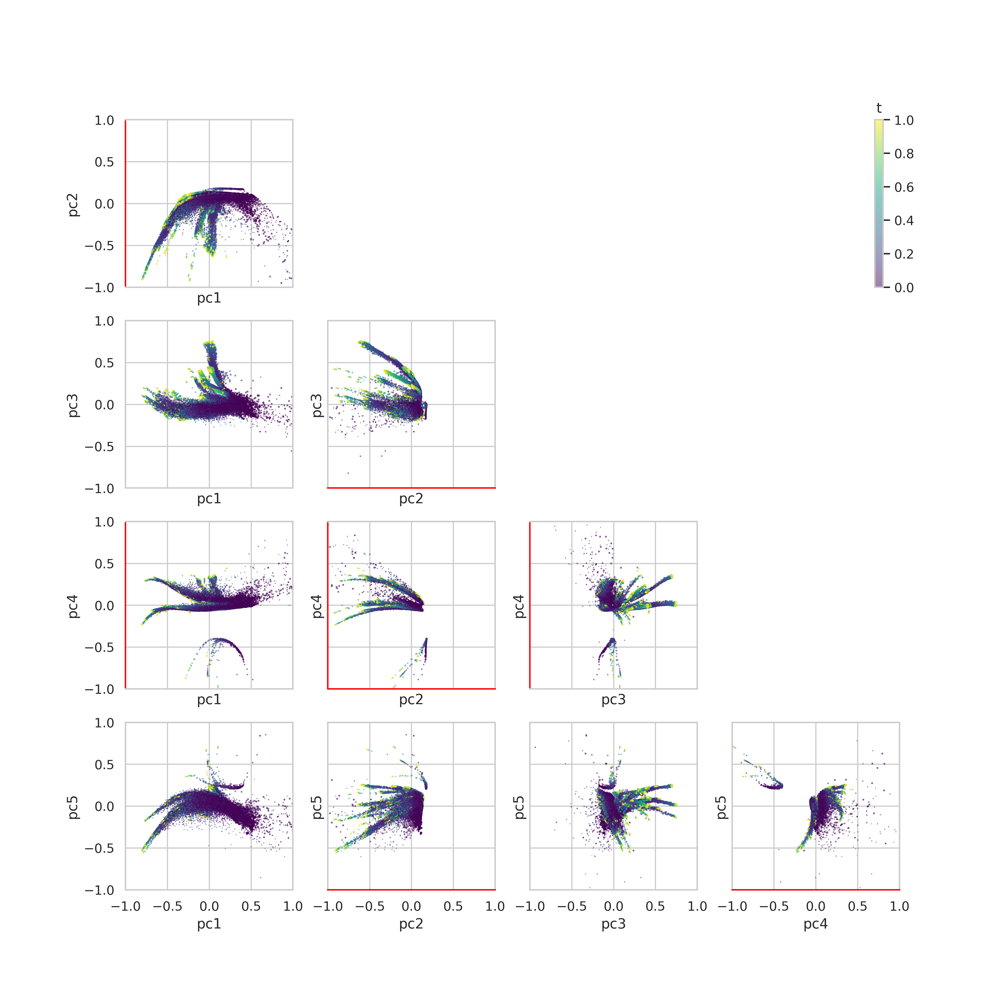

In [99]:
triplot(dc, r, d=5, key='m', cmap='viridis', cdict=None, ckey='t', sdict={},
            markers=["o", "x", "s", "*", "+", ".", ],
            evals=False, plot_avg=False
            )

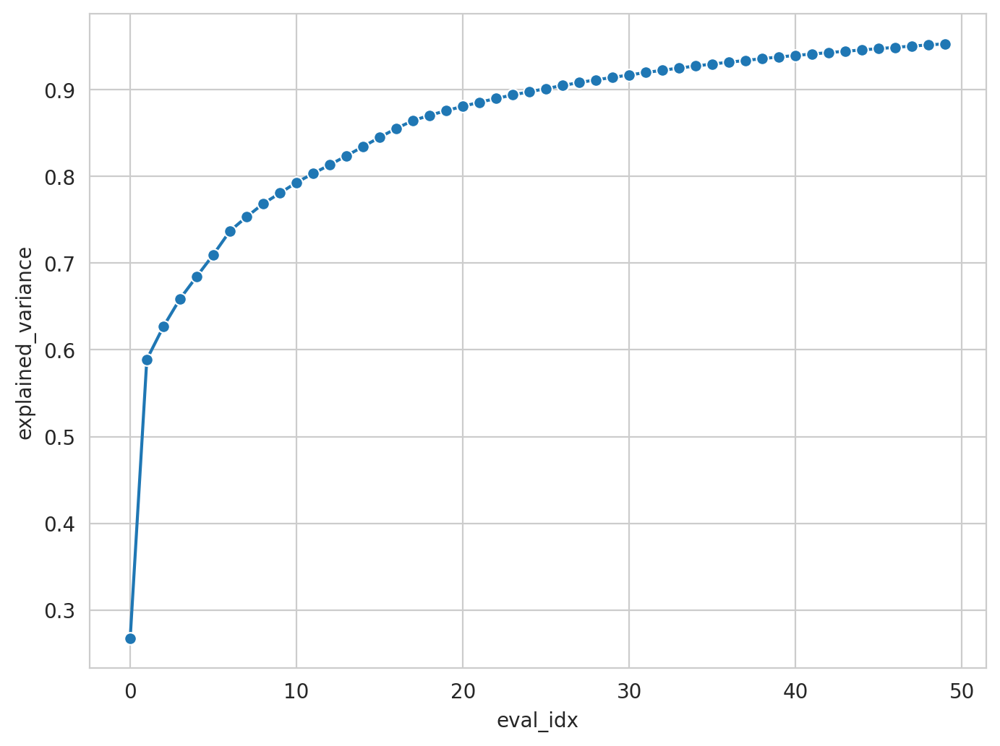

In [144]:
es = r['es'][-50::]
es =es[::-1]
df = pd.DataFrame(dict(eval_idx=np.arange(len(es)), explained_variance=1 - np.sqrt(1-np.cumsum(es ** 2)/r['fn']**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='explained_variance', marker="o")